In [1]:


import torch
import torch.nn as nn
import numpy as np
import pandas as pd

from torch.utils.data import Dataset

import pandas, random, numpy
import matplotlib.pyplot as plt

from PIL import Image, ImageOps


import glob
import PIL

from sklearn.model_selection import train_test_split


In [2]:

civs_path = 'data/imgs.new.CIVS'


In [3]:

path  = civs_path

paths = glob.glob(path + "/*.jpg") # Grabbing all the image file names

n_images = len(paths)

rand_idxs = np.random.permutation(n_images)

paths_subset = np.random.choice(paths, n_images , replace=False) 
all_paths    = paths_subset[rand_idxs]

print(n_images)


5016


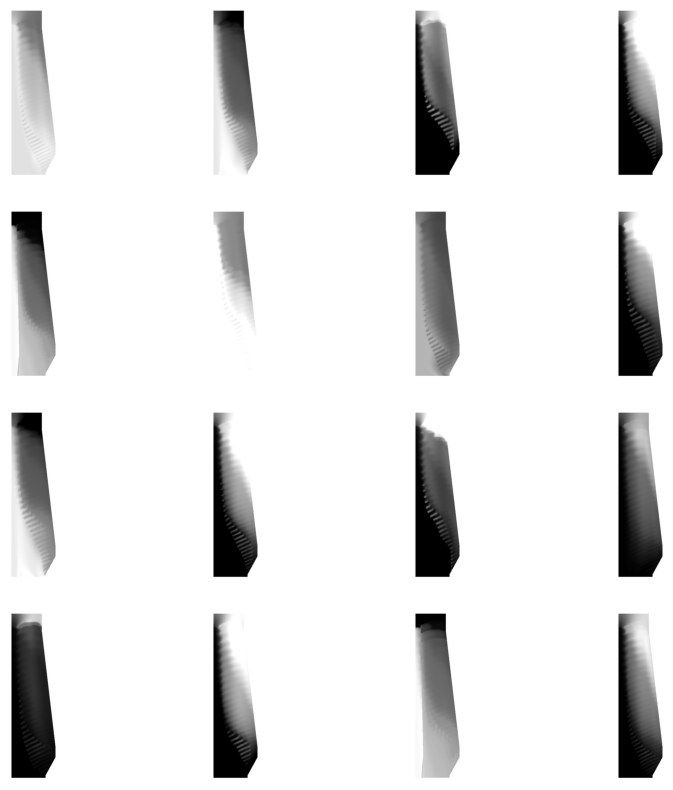

In [4]:

_, axes = plt.subplots(4, 4, figsize=(10, 10))

for ax, img_path in zip(axes.flatten(), all_paths):
    ax.imshow(Image.open(img_path))
    ax.axis("off")


In [5]:

## data/imgs.new.CIVS/h2_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2o_Ng0_Pci150_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg
## data/imgs.new.CIVS/h2_Ng40_Pci60_H0_Wp0_Ph300_Ox23_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg

    
## ['tg', 'Ng0', 'Pci175', 'H0', 'Wp0', 'Ph300', 'Ox24', 'Ow7', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
    


In [6]:

'''

['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']
['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']
['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']


'''


"\n\n['tg',  'Ng120', 'Pci0', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow3.0', 'Hbt1485', 'Wm12.2', 'Wr308750.4']\n['h2o', 'Ng70', 'Pci0', 'H0', 'Wp0', 'Ph500', 'Ox24', 'Ow5.0', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n['co2', 'Ng50', 'Pci200', 'H0', 'Wp0', 'Ph300', 'Ox30', 'Ow4', 'Hbt1459.8', 'Wm12.2', 'Wr308750.4']\n\n\n"

In [7]:

def label_func2(fname):
    ## print(fname)
    fname = fname.replace("data/imgs.new.CIVS/","")
    temp_name = fname.replace(".jpg", "").split("_")
    ## print(temp_name)
    
  
    y0 = temp_name[0]                              ## tg
    y1 = float(temp_name[1].replace("Ng", ""))     ## 'Ng0'
    y2 = float(temp_name[2].replace("Pci", ""))    ## 'Pci175'
    y3 = float(temp_name[3].replace("H", ""))     ## 'H0'
    y4 = float(temp_name[4].replace("Wp", ""))     ## 'Wp0'
    y5 = float(temp_name[5].replace("Ph", ""))     ## 'Ph300'
    y6 = float(temp_name[6].replace("Ox", ""))    ## 'Ox24'
    y7 = float(temp_name[7].replace("Ow", ""))     ## 'Ow7
    y8 = float(temp_name[8].replace("Hbt", ""))    ## 'Hbt1459.8'
    y9 = float(temp_name[9].replace("Wm", ""))    ## 'Wm12.2'
    y10 = float(temp_name[10].replace("Wr", ""))    ## 'Wr308750.4'
    
 
    ## np.array([y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ])
    return [fname, y0, y1, y2, y3, y4, y5, y6, y7, y8, y9, y10 ]


In [8]:

## 1400, 390
## x 0.2
## 280 , 78


list_imgs = []
list_label_vectors = []

for img_name in all_paths:
    ##print(img_name)
    
    my_img = Image.open(img_name)
    
    my_img = my_img.resize((39, 140))
    my_img = ImageOps.grayscale(my_img)
 

    img_np = np.array(my_img)

    ## img_np = img_np.reshape(-1)
    
    temp_label_vector_rc = label_func2(img_name)
    if temp_label_vector_rc[1] == "tg":
    
        ## print(img_np.shape)
        list_imgs.append(img_np)

        list_label_vectors.append( temp_label_vector_rc )


In [9]:

X =  list_imgs
y =  list_label_vectors 


In [10]:

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

#######################################################

print(len(X_train))
print(len(X_test))
print(len(y_train))
print(len(y_test))


668
168
668
168


In [11]:

list_ids_train      = []
list_features_train = []
list_imgs_train     = []


for index in range(len(X_train)):
    
    # image target (label)
    reg_vals = y_train[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_train[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
        
    list_ids_train.append(          reg_vals[0]                )
    list_imgs_train.append(        single_np_img               )
    list_features_train.append(    target      )


In [12]:


list_ids_test      = []
list_features_test = []
list_imgs_test     = []


for index in range(len(X_test)):
    
    # image target (label)
    reg_vals = y_test[index]
    target = np.zeros( (10) )
    
    target[ 0 ] = reg_vals[2]
    target[ 1 ] = reg_vals[3]
    target[ 2 ] = reg_vals[4]
    target[ 3 ] = reg_vals[5]
    target[ 4 ] = reg_vals[6]
    target[ 5 ] = reg_vals[7]
    target[ 6 ] = reg_vals[8]
    target[ 7 ] = reg_vals[9]
    target[ 8 ] = reg_vals[10]
    target[ 9 ] = reg_vals[11]

    # image data, normalised from 0-255 to 0-1
    single_np_img = X_test[index]
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ) / 255.0
    ## image_values = torch.FloatTensor(  single_np_img.astype(float)  ).permute(2,0,1).view(1,3,280,80) / 255.0
        
    list_ids_test.append(          reg_vals[0]                )
    list_imgs_test.append(        single_np_img               )
    list_features_test.append(    target      )




In [13]:

conditions_matrix_train = np.array( list_features_train )
conditions_matrix_test  = np.array( list_features_test )


In [14]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


(668, 10)
(168, 10)



## Save data for deployment


In [15]:


DF_conditions_train = pd.DataFrame(conditions_matrix_train)
DF_conditions_train.to_csv("PD_conditions_train.csv")


In [16]:

DF_ids_train = pd.DataFrame(list_ids_train)
DF_ids_train.to_csv("PD_ids_train.csv")


In [17]:

list_imgs_train_stretched = [     the_img_np.reshape(-1)         for the_img_np in list_imgs_train]
DF_imgs_np_train = pd.DataFrame(list_imgs_train_stretched)
DF_imgs_np_train.to_csv("PD_imgs_np_train.csv")



## KNN part


In [18]:

def euclidean_distance(v1, v2):
    return np.sqrt( np.sum(   (v1 - v2)**2   )   )


In [19]:

def predict(test_x):
    
    ## calculate distances between test_x and all dta samples in x
    ## this distances vector is a vector of 45 distances
    ## distances = [ euclidean_distance(test_x , x)  for x in X_train    ]

    distances = [ euclidean_distance(test_x, x )  for x in conditions_matrix_train   ]
      
    
    ## distances - > [23, 3, 145, 17, ...]
    
    k = 3
    
    ## sort by distance value and return the k nearest neighbors
    ## np.argsort returns the indices of the k neares neighbors
    k_neighbor_indices = np.argsort(distances)[:k]
    print(k_neighbor_indices)
    
    
    ## with indices, extract labels from y_train 
    img_names = [ list_ids_train[i]  for i in k_neighbor_indices  ]
    ## imagine labels = [ 1, 1, 2, 0, 1]
    
    ## from labels, select the most common label
    ## most_common_label = Counter(labels).most_common(1)
    
    return img_names
    


In [20]:

def generate_img_per_index(index):
    
    res = predict( conditions_matrix_test[  index  ] )
    print(res)
      
    selected_imgs_to_avg = []

    for img_name in res:
        img_name = "data/imgs.new.CIVS/" + img_name
        my_img = Image.open(img_name)
        ## my_img = my_img.resize((80, 280))
        my_img = ImageOps.grayscale(my_img)
        img_np = np.array(my_img)
        ## img_np = img_np.reshape(-1)
        selected_imgs_to_avg.append(img_np)
    avg_gen_img = np.mean( np.array(selected_imgs_to_avg), axis=0 )
    print(avg_gen_img.shape)
    gen_pil_image  = Image.fromarray(avg_gen_img).convert('L')
    
    real_my_img = np.array(list_imgs_test[index])
    real_pil_image = Image.fromarray(real_my_img)
    real_pil_image = ImageOps.grayscale(real_pil_image)
    
    print(gen_pil_image)
    print(real_pil_image)
    
    return gen_pil_image, real_pil_image
    



## Inference


(668, 10)
(168, 10)
[636  96 215]
['tg_Ng60_Pci90_H0_Wp0_Ph300_Ox25_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng60_Pci90_H0_Wp0_Ph300_Ox25_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng60_Pci90_H0_Wp0_Ph300_Ox25_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C7517EED0>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C7517E910>


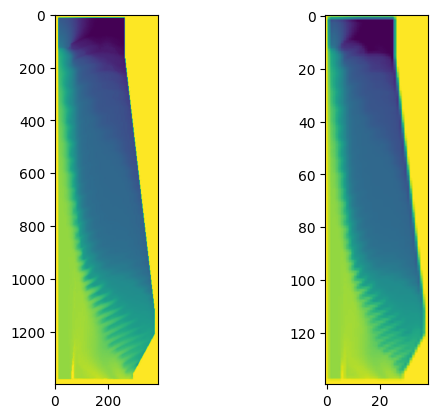

In [21]:



print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )

gen_pil_image, real_pil_image = generate_img_per_index(17)


fig, ax = plt.subplots(1,2)
ax[0].imshow(gen_pil_image)
ax[1].imshow(real_pil_image)




(668, 10)
(168, 10)
[177 399 390]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow7.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CA27CECD0>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C32B774D0>
[550 407 543]
['tg_Ng0_Pci124_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci124_H0_Wp0_Ph300_Ox24_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci124_H0_Wp0_Ph300_Ox24_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C800EE110>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C800EE510>
[169 132 323]
['tg_Ng30_Pci20_H0_Wp0_Ph300_Ox21_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng30_Pci20_H0_Wp0_Ph300_Ox21_Ow4_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng30_Pci20_H0_Wp0_Ph300_Ox21_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.I

/Users/user/opt/anaconda3/envs/py37_new_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == "__main__":


[305 151 146]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow4.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow3.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C30C33150>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C30C33350>
[215 636  96]
['tg_Ng60_Pci90_H0_Wp0_Ph300_Ox25_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng60_Pci90_H0_Wp0_Ph300_Ox25_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng60_Pci90_H0_Wp0_Ph300_Ox25_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C8017F390>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C8017F310>
[300 620 227]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox27_Ow7.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox27_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox27_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390

[126 200  64]
['tg_Ng90_Pci0_H0_Wp0_Ph500_Ox24_Ow5.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph500_Ox24_Ow8.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph500_Ox24_Ow4.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C77664ED0>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C77664E50>
[662 353 330]
['tg_Ng70_Pci0_H0_Wp0_Ph300_Ox24_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng70_Pci0_H0_Wp0_Ph300_Ox21_Ow4.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C80949190>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C80949110>
[600 166 347]
['tg_Ng37.9_Pci0_H0_Wp0_Ph400_Ox30_Ow5.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph400_Ox30_Ow4.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph400_Ox30_Ow8.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image 

(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C91C01590>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C91C019D0>
[198 548   4]
['tg_Ng0_Pci175_H0_Wp0_Ph300_Ox21_Ow9_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox21_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng0_Pci175_H0_Wp0_Ph300_Ox21_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CA2FDC610>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CA2FDCA10>
[476 445 237]
['tg_Ng37.9_Pci0_H0_Wp0_Ph500_Ox21_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph500_Ox21_Ow7_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng37.9_Pci0_H0_Wp0_Ph500_Ox24_Ow9.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C8186E610>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C8186EA10>
[265 233 290]
['tg_Ng120_Pci0_H0_Wp0_Ph400_Ox30_Ow3.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph400_Ox30_Ow5.0_Hbt1

[258 130 247]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow5.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow9.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C334FE050>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C334FE090>
[317 422 259]
['tg_Ng160_Pci40_H0_Wp0_Ph300_Ox27_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng160_Pci40_H0_Wp0_Ph300_Ox27_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng160_Pci40_H0_Wp0_Ph300_Ox27_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CA3BD1090>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CA3BD1190>
[241 350 257]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox24_Ow8_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L si

(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C8222E150>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C92372490>
[488 596 412]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow4.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow5.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox30_Ow3.0_Hbt1410_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CA3ED0410>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CA3ED0490>
[327  34  59]
['tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow4.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox21_Ow7.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7CA3EEC190>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7CA3EEC590>
[421 406 546]
['tg_Ng150_Pci0_H0_Wp0_Ph300_Ox30_Ow9.0_Hbt1410_Wm12.2_Wr308750.4.jpg', 'tg_Ng150_Pci0_H0_Wp0_Ph300_Ox30_Ow7.0_Hbt1410_Wm12.2_Wr

[491 342 378]
['tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow3_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow5_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng90_Pci0_H0_Wp0_Ph300_Ox27_Ow6_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C34539890>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C34539810>
[172  53 322]
['tg_Ng38_Pci0_H0_Wp0_Ph300_Ox24_Ow6.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox24_Ow4.0_Hbt1485_Wm12.2_Wr308750.4.jpg', 'tg_Ng38_Pci0_H0_Wp0_Ph300_Ox24_Ow3.0_Hbt1485_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L size=390x1400 at 0x7F7C348793D0>
<PIL.Image.Image image mode=L size=39x140 at 0x7F7C348797D0>
[368 190 473]
['tg_Ng120_Pci0_H0_Wp0_Ph400_Ox24_Ow6.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph400_Ox24_Ow8.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg', 'tg_Ng120_Pci0_H0_Wp0_Ph400_Ox24_Ow5.0_Hbt1459.8_Wm12.2_Wr308750.4.jpg']
(1400, 390)
<PIL.Image.Image image mode=L si

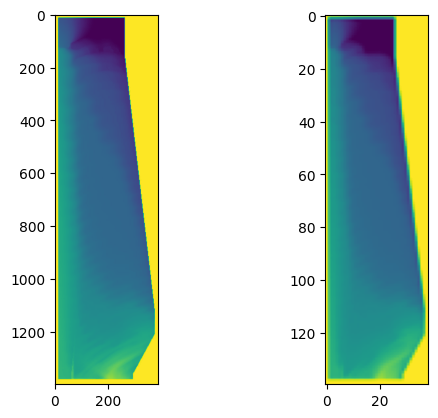

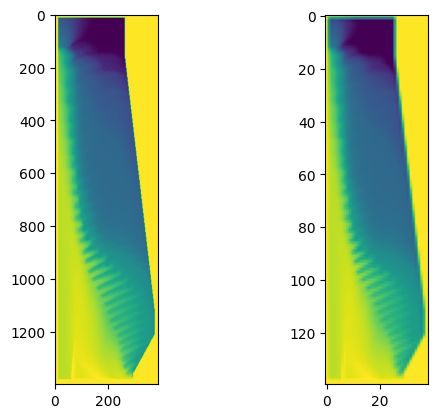

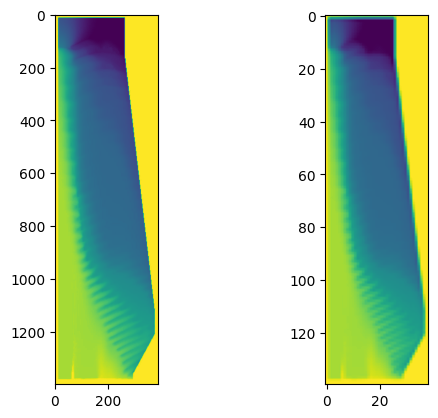

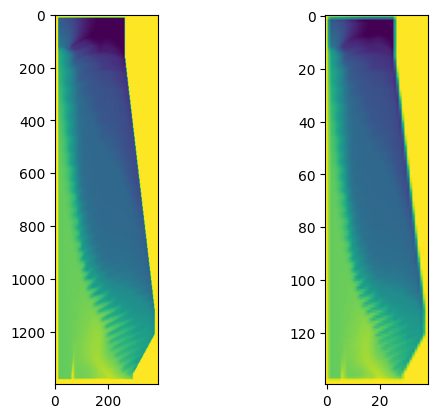

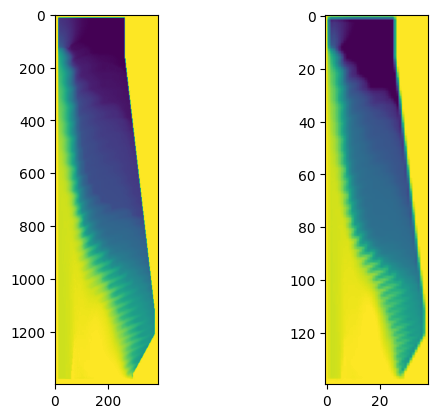

...

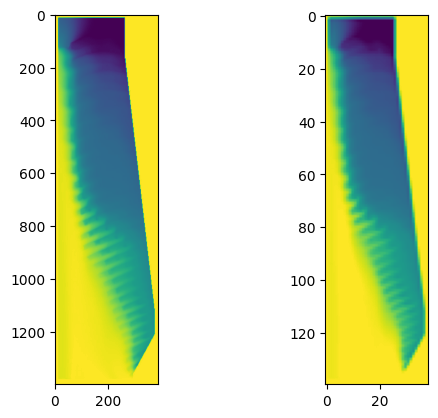

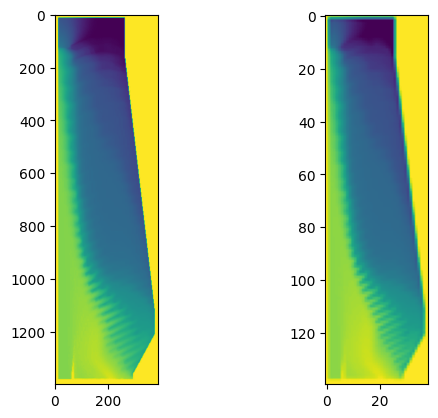

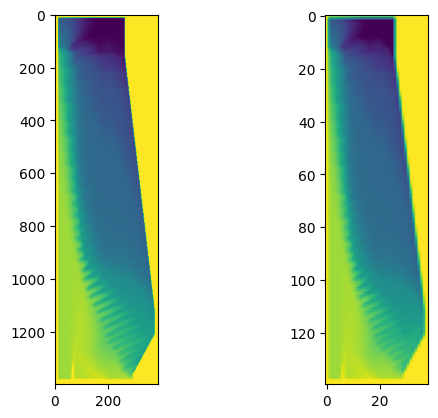

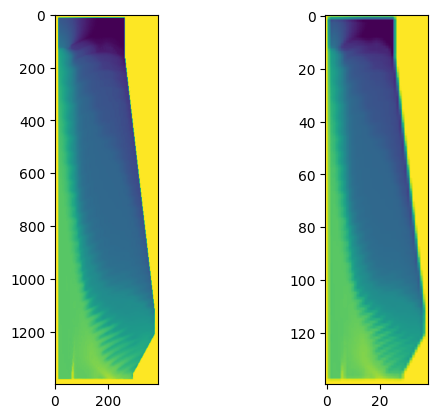

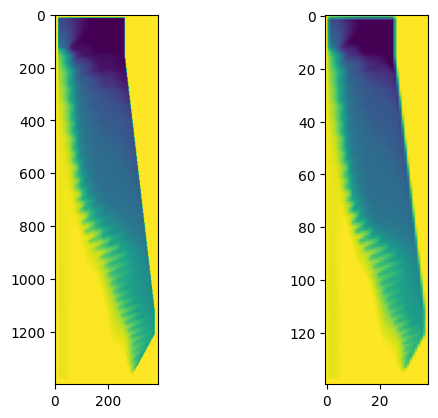

In [22]:

print( conditions_matrix_train.shape )
print( conditions_matrix_test.shape  )


for test_i in range( conditions_matrix_test.shape[0]  ):

    gen_pil_image, real_pil_image = generate_img_per_index(test_i)

    fig, ax = plt.subplots(1,2)
    ax[0].imshow(gen_pil_image)
    ax[1].imshow(real_pil_image)
